This notebook contains interactive figures and maps to visualize them open it in Jupyter nbviewer.
<table align="left">  
<td>
<a href="https://nbviewer.org/github/nawalboudchar/NO2-Emission-Remote-Sensing/blob/main/NO2_Emission_from_Electricity_Generation.ipynb" target="_parent">
    <img src="https://img.shields.io/badge/nbviewer-orange.svg" alt="Open In NBviewer"/>
</a>
</td>
</table>

<div align='center'> <font size='5' color='purple'> Calculating NO2 Emission from Electricity Generation using Remote Sensing </font> </div>

Although electricity is a clean and relatively safe form of energy when it is used, the generation and transmission of electricity affects the environment. Nearly all types of electric power plants have an effect on the environment. For example, Electric power sector power plants that burned fossil fuels (coal, natural gas, and petroleum) or materials made from fossil fuels, and some geothermal power plants, were the source of about 28% of total U.S. energy-related CO2 emissions in 2020 ([Source: U.S. Energy Information Administration](https://www.eia.gov/energyexplained/electricity/electricity-and-the-environment.php)).

The main air pollutant emissions from most power plants are Nitrogen oxides (NOx), Carbon dioxide (CO2), Carbon monoxide (CO), and Sulfur dioxide (SO2). All of these emissions have negative effects on the atmosphere and human health.

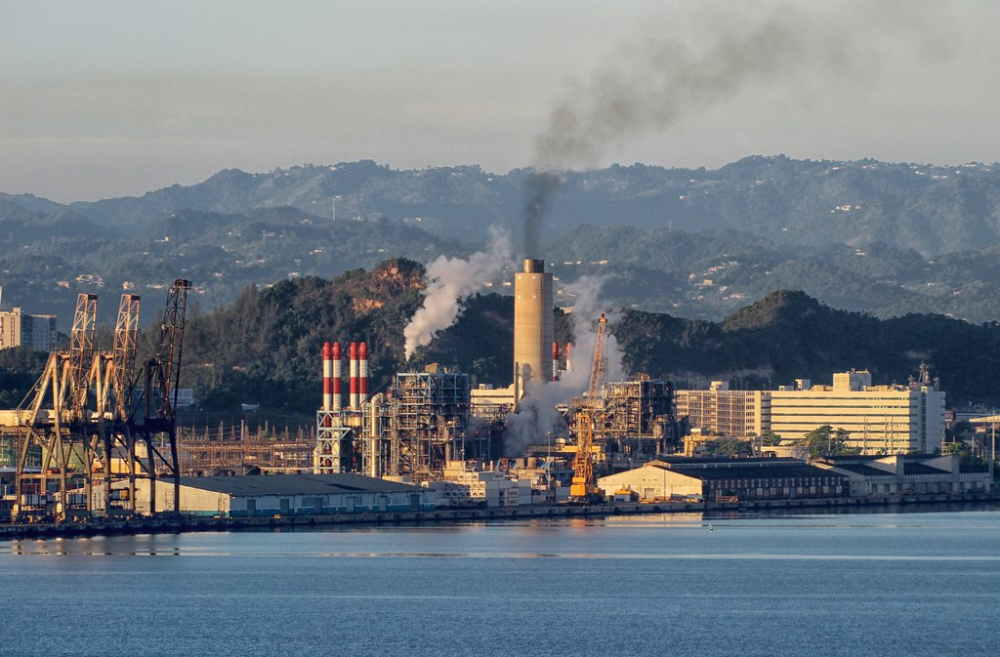

In [1]:
import os
from IPython.display import Image, IFrame

IMAGES_PATH = "./images"
Image(os.path.join(IMAGES_PATH, "san-juan-pp-puerto-rico.jpg"))

<div align='center'> <font size='3' color='#3399CC'> San Juan Power Plant - Puerto Rico </font> </div>

### Content
    Imports
    Setup
    Utility Functions
    1 Overview
    2 Data Description
        1 Global power plant database
        2 Sentinel-5P offline NO2 dataset
        3 Evaluation Data
        4 Google Earth Engine (GEE)
    3 Methodology
    4 Implementing the Methodology Step by Step
        1 Puerto Rico power plants and NO2 images
        2 AOIs and buffer zones mask
        3 Distance weights
        4 Composite NO2 image of AOIs
        5 Total NO2 emission
    5 Individual Power Plant NO2 Emission
        1 Total NO2 emission in 2019
        2 Evaluation
    6 Conclusion

### Imports

In [2]:
import os
import gc
import math
import numpy as np
import pandas as pd

import ee
import folium
import branca.colormap as cm

import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)

### Setup

In [4]:
# Trigger the authentication flow
# ee.Authenticate()

Enter verification code: 4/1AfJohXl967UBUXOhHoZsel0ezTzZtnZBJ2YeoZdV-SXlKdH7Hyr22zo_qlo

Successfully saved authorization token.


In [3]:
# Initialize Google Earth Engine API
ee.Initialize()

In [3]:
# Paths
DATA_PATH = "./data"
FIGURES_PATH = "./figures"

month_map = {1:'January', 2:'February', 3:'March', 4:'April', 5:'May', 6:'June',\
            7:'July', 8:'August', 9:'September', 10:'October', 11:'November', 12:'December'}

### Utility Functions

In [5]:
def _add_tilelayer(self, tile, name, vis_params):
    """ Adds a raster tile layer to folium map. """
    folium.TileLayer(
        tiles = tile,
        attr = "Map Data &copy Google Earth Engine",
        name = name,
        overlay = True,
        control = True
    ).add_to(self)
    if ((vis_params['min'] != 0.0) or (vis_params['max'] != 0.0)):
        colormap = cm.LinearColormap(colors=vis_params['palette'],\
                                 vmin=vis_params['min'], vmax=vis_params['max'],\
                                 index=[vis_params['min'], vis_params['max']/2 , vis_params['max']],\
                                 caption=name).add_to(self)

def add_ee_layer(self, ee_obj, name, vis_params):
    """ Adds an EE object on a folium map.
    EE object can be a simple geometry object, an image,
     or an image collection.
    """
    try:
        if isinstance(ee_obj, ee.geometry.Geometry):
            folium.GeoJson(
                data = ee_obj.getInfo(),
                name = name,
                overlay = True,
                control = True,
            ).add_to(self)
        elif isinstance(ee_obj, ee.feature.Feature) or\
        isinstance(ee_obj, ee.featurecollection.FeatureCollection):
            map_id_dict = ee_obj.getMapId(vis_params)
            tile = map_id_dict['tile_fetcher'].url_format
            _add_tilelayer(self, tile, name, vis_params)
        elif isinstance(ee_obj, ee.image.Image):
            map_id_dict = ee.Image(ee_obj).getMapId(vis_params)
            tile = map_id_dict['tile_fetcher'].url_format
            _add_tilelayer(self, tile, name, vis_params)
        elif isinstance(ee_obj, ee.imagecollection.ImageCollection):
            ee_obj_new = ee_obj.mosaic()
            map_id_dict = ee.Image(ee_obj_new).getMapId(vis_params)
            tile = map_id_dict['tile_fetcher'].url_format
            _add_tilelayer(self, tile, name, vis_params)
    except:
        print("Could not dispaly {}".format(name))

def plot_ee_layer(ee_obj, name, vis_params, lat, lon, zoom):
    """ Overlays an EE object on a folium map. """
    folium.Map.add_ee_layer = add_ee_layer
    m = folium.Map(location=[lat, lon], 
                   tiles='OpenStreetMap',
                   height=500, 
                   zoom_start=zoom)
    m.add_ee_layer(ee_obj, name, vis_params)
    m.add_child(folium.LayerControl())
    return m

def plot_ee_layers(ee_objects, names, vis_params_l, lat, lon, zoom):
    """ Overlays a list of EE objects in the same folium map"""
    folium.Map.add_ee_layer = add_ee_layer
    m = folium.Map(location=[lat, lon], 
                   tiles='OpenStreetMap',
                   height=500, 
                   zoom_start=zoom)
    for i in range(len(ee_objects)):
        m.add_ee_layer(ee_objects[i], names[i], vis_params_l[i])
    m.add_child(folium.LayerControl())
    return m

def get_fuel_color(fuel_type):
    """ Attributes a color to each fuel type. """
    
    fuel_color = {'Oil': 'black', 'Coal': 'darkred', 'Gas': 'lightgray',
                  'Solar': 'orange', 'Wind': 'lightgreen', 'Hydro': 'lightblue'}
    return fuel_color[fuel_type]

def add_pp_to_map(pp_df, m):
    """ Adds power plants location and other information to a folium map. """
    for idx, row in pp_df.iterrows():
        location = [row['latitude'], row['longitude']]    
        color = get_fuel_color(row['fuel1'])
        icon = folium.Icon(color=color, icon_color='white', icon='bolt', prefix='fa')
        tooltip = "Name: {} <br> Fuel: {} <br> Creation year: {} <br> Capacity (MW): {}".format(
            row['name'],row['fuel1'], row['comm_year'], row['capacitymw'])
        folium.Marker(location=location, tooltip=tooltip, icon=icon).add_to(m)
    return m

# 1 Overview

In this notebook I present an approach to quantify NO2 emission for electricity generation using satellite data and remote sensing techniques. The final result was very astonishing that after applying this approach to a group of 13 power plants over USA `the average difference between the bottom-up emission and the computed emission was only 3.23 Ton in 2019`.

Firstly, let's outline breifly the main aspects of this work. 

**Goal**: Compute NO2 from power plants across USA.

**Main Dataset**: Sentinel 5P NO2 offline satellite images from Google Earth Engine, which provides offline high-resolution imagery of NO2 concentration.

**Methodology**:

Basically, the developed method consists of five main steps:

1. Define Areas Of Interest (AOIs): By creating a buffer zone around each power plant using its geographic coordinate point and a relative radius.


2. Create power plants buffer zones mask: this mask is used to exclusively keep pixels within power plants buffer zones.


3. Compute Distance Weights: The idea behind distance weights is that pixels away from power plant center will get less weight and pixels near to the centroid will get higher weight.


4. Build Composite NO2 Image of AOIs: It's about combine a NO2 image collection over a chosen time period into a single image using summation function. Then by applying the buffer zones mask I keep just values of AOIs regions.


5. Calculate Total NO2 Emission: It's a weighted summation of NO2 values and distance weights, The NO2 values are the values of the composite NO2 image for a specified region over a time period which is built in step four.



**Evaluation**:

For evaluation I will compare model output with NO2 ground-based emission data provided by Environmental Protection Agency, further details about this dataset are given in section 2 Data Description.

<br/><br/>
This notebook is organized as follows. I'm going to start by data description then a detailed method explanation is provided. Next, I proceed with implementing the methodology step by step for Puerto Rico power plants. After that, individual power plant NO2 emission is computed using the developed approach and the evaluation result is reported. Lastly, concluding with some advantages of the method and a few improvement possibilities.

<div> <font size='5' color=''> 2 Data Description </font> </div>
<br/>
<div> <font size='3' color='#3399CC'> 1. Global Power Plant Database </font> </div>

The Global Power Plant Database is a comprehensive, open source database of power plants around the world. Each power plant is geolocated and entries contain information on plant capacity, generation, ownership, and fuel type. The database covers approximately 30,000 power plants from 164 countries and includes thermal plants (e.g. coal, gas, oil, nuclear, biomass, geothermal) and renewables (e.g. hydro, wind, solar). Provided by World Resources Institute (WRI). [Source](https://developers.google.com/earth-engine/datasets/catalog/WRI_GPPD_power_plants)

In [6]:
# USA Power Plants
pp_fc = ee.FeatureCollection("WRI/GPPD/power_plants").filter(ee.Filter.eq('country', 'USA'))

# Select only the useful features for this analysis
columns = ['gppd_idnr', 'name', 'latitude', 'longitude', 'fuel1',
           'capacitymw', 'comm_year', 'gwh_estimt']
pp_fc = pp_fc.select(propertySelectors=columns)

<div> <font size='3' color='#3399CC'> 2. Sentinel-5P Offline NO2 dataset </font> </div>

This dataset provides offline high-resolution imagery of NO2 concentrations. Sentinel-5 Precursor (Sentinel-5P) is an earth observation satellite developed by European Space Agency (ESA) as part of the Copernicus Program. The Copernicus Program is dedicated to monitoring air pollution. Sentinel-5P consists of an instrument called Tropomi (TROPOspheric Monitoring Instrument) which is a spectrometer to monitor ozone, methane, formaldehyde, aerosol, carbon monoxide, NO2 and SO2 in the atmosphere. [Source](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_OFFL_L3_NO2)


- Although the satellite data include stratospheric NO2 and tropospheric NO2, for this work I'm mostly interested in tropospheric level of NO2 (the closest layer to the surface of the earth) as it indicates more directly outputs from power stations and other sources. So I will used `tropospheric_NO2_column_number_density` data column.

In [7]:
# NO2 Satellite image collection
no2_imgc = ee.ImageCollection("COPERNICUS/S5P/OFFL/L3_NO2").select('tropospheric_NO2_column_number_density')

<div> <font size='3' color='#3399CC'> 3. Evaluation Data </font> </div>


- NO2 Bottom-up Emission for each Power Plant

This dataset contains for each power plant yearly total NO2 ground-based data for the year 2019, in adddition to some other properties such as power plant state, latitude, and longitude. It will be the bottom-up emission data to evaluate my approach by comparing this yearly total NO2 with the computed total NO2. Provided by Environmental Protection Agency (EPA). [Source](https://www.epa.gov/airmarkets/power-plant-emission-trends)

In [8]:
# Power plants bottom-up NO2 emission of 2019
epa_pp_no2_df = pd.read_csv(os.path.join(DATA_PATH, 'epa_pp_no2_emission_2019.csv'))
epa_pp_no2_df.head(3)

,Facility Name,State,1995 NOX Emissions (tons),2019 NOX Emissions (tons),1995 vs 2019 NOX Emissions (tons),Latitude (degrees),Longitude (degrees)
0,AMEA Sylacauga Plant,AL,NaN,23.0,NaN,33.1661,-86.2825
1,Barry,AL,"33,140",2361.0,"-30,779",31.0069,-88.0103
2,Calhoun Energy Center,AL,NaN,60.0,NaN,33.5883,-85.9731


<div> <font size='3' color='#3399CC'> 4 Google Earth Engine (GEE) </font> </div>

GEE is an advanced cloud-based geospatial processing service platform that enables users to analyze satellite images at global scale. For this analysis I will extensively rely on GEE backend to have enough computing resources for applying remote sensing techniques.

# 3 Methodology

To compute NO2 from power plants I will use the following steps:

**1. Define Areas Of Interest (AOIs)**

Firstely, get the geographic coordinate point of each power plant and then draw a circle around that point using a relative radius. That radius is determined by the power plant capacity in Megawatt and a multiplication factor. This way not all power plants circles will be the same and the higher a power plant capacity the larger its circle will be.


**2. Create Power Plants Buffer Zones Mask**

In this step I form a mask by selecting only the created AOIs geographic regions. That is when applying this mask to Sentinel 5P NO2 images I will get uniquely NO2 of the buffer zones around power plants. This way I can reduce some noise from other NO2 sources like other power plants.


**3. Compute Distance Weights**

Distance weights defined how far a pixel is located from the center of power plant. So first, I will caculate the distance between pixel and power plant center, then based on that distance compute the pixel distance weight, where each pixel get less weight as moving away from the source centroid. This way it's possible to minimize some noise like NO2 that is far from power plant center is probably not from it.


**4. Build Composite NO2 Image of AOIs**

The aim of this step is aggregate a NO2 image collection over a given time period into a composite NO2 image, where each pixel is the sum of values from the colllection corresponding pixels. After that apply power plants buffer zones mask to pick out AOIs pixels at most.


**5. Calculate Total NO2 Emission**

To get the total NO2 emission I simply adds up the result of multiplying the built composite NO2 image values and the computed distance weights.

# 4 Implementing the Methodology Step by Step

This section is about applying the approach step by step for Puerto Rico region. In other words, it gives the actual implementation of what is performed at each stage with output visualization for better understanding.

## 4.1 Puerto Rico Power Plants and NO2 Images 

First, I'm going to get the geographic area of Puerto Rico in order to select its power plants and limit NO2 images to its geographic boundaries.

In [9]:
# Geographic area of Puerto Rico
pr_geometry = ee.FeatureCollection("TIGER/2018/States").filter(ee.Filter.eq('NAME', 'Puerto Rico')).geometry()
pr_center_point = pr_geometry.centroid().getInfo()['coordinates']
pr_loc = [pr_center_point[1], pr_center_point[0]]  # location

# Power Plants of Puerto Rico
pp_pr_fc = pp_fc.filter(ee.Filter.bounds(pr_geometry))

# NO2 images
no2_pr_imgc = no2_imgc.filterBounds(pr_geometry)

# Create pandas dataframe of power plants
pp_pr_df = pd.DataFrame()
cols = ['name', 'latitude', 'longitude', 'fuel1', 'capacitymw', 'comm_year']
for i in range(len(cols)):
    pp_pr_df[cols[i]] = pp_pr_fc.reduceColumns(reducer=ee.Reducer.toList(),
                                        selectors=[cols[i]]).getInfo().get('list')
pp_pr_df["comm_year"] = np.where(pp_pr_df['comm_year'] == 0, "Unknown", pp_pr_df['comm_year'])

Now, Let us glance at how a daily value of NO2 is spread over Puerto Rico and visualize its power plants as well.

In [11]:
# # Display NO2 image of 1 July 2018 over Puerto Rico,
# # Also in the same map plot power plants of the region
# date = ee.Date("2018-07-01")
# no2_img = no2_pr_imgc.filterDate(date, date.advance(1, 'day')).mosaic()
# no2_img = no2_img.clip(pr_geometry)
# no2_min_max = no2_img.reduceRegion(ee.Reducer.minMax(), scale=1113).getInfo()
# min_val = no2_min_max['tropospheric_NO2_column_number_density_min']
# max_val = no2_min_max['tropospheric_NO2_column_number_density_max']

# vis_params = {
#     'min': min_val,
#     'max': max_val,
#     'palette': ['blue', 'white', 'red']
# }
# no2_perday_map = plot_ee_layer(no2_img, 'Tropospheric NO2 density (mol/m^2)',
#                                vis_params, pr_loc[0], pr_loc[1], 9)
# no2_perday_map = add_pp_to_map(pp_pr_df, no2_perday_map)

# no2_perday_map.save(os.path.join(FIGURES_PATH,'NO2-01-July-2018-PP-PR.html'))

# title = 'NO2 Concentration on {} {} {}'.format(date.get('day').getInfo(),\
#                                               month_map[date.get('month').getInfo()],\
#                                               date.get('year').getInfo())
# print(' \n\t\t\t\t \033[1;34m {}  \n'.format(title))
# no2_perday_map
IFrame(src=os.path.join(FIGURES_PATH,'NO2-01-July-2018-PP-PR.html'),
       width = 950, height = 530)

 
				  NO2 Concentration on 1 July 2018  



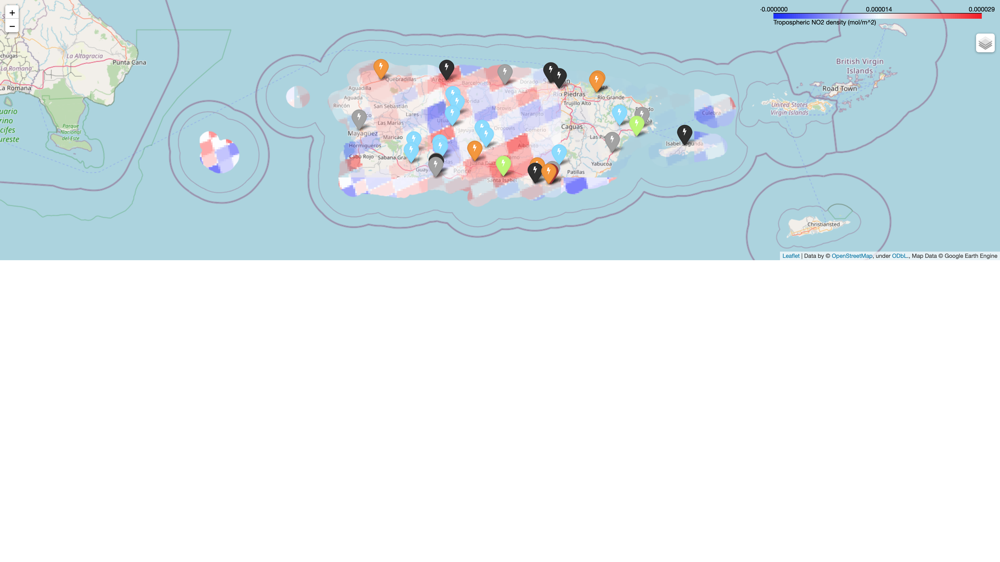

In [13]:
Image(os.path.join(IMAGES_PATH, "NO2-01-July-2018-PP-PR.png"))

## 4.2 AOIs and Buffer Zones Mask

At the first step of the methodology I apply GEE buffer fuction to each power plant and the result will be my AOIs collection. Next (2nd step) I depict the geometries of the buffer zones collection onto an image and use it as a mask to exclude pixels that don't fall in AOIs.

In [12]:
def create_pp_buffer(pp_f):
    """
    Creates a circle around the input power plant feature using a relative radius.
    """
    radius = ee.Number(pp_f.get('capacitymw')).multiply(1.1)
    pp_buffer = pp_f.buffer(radius)
    return ee.Feature(pp_buffer)

In [13]:
# Create a circle around each power plant of Puerto Rico
pp_pr_buffer_fc = pp_pr_fc.map(lambda feature: create_pp_buffer(feature))

In [14]:
# Create power plants buffer zones mask
pp_pr_mask = ee.Image().toByte().paint(pp_pr_buffer_fc, 1)

Let's now visualize the power plants with their buffers which represent the mask that will be used later.

In [4]:
# # Plot power plants and their buffers which represent the mask
# vis_params_pp = {
#     'min': 0.0,
#     'max': 0.0,
#     'color': 'red'
# }
# vis_params_mask = {
#     'min': 0.0,
#     'max': 0.0,
#     'color': '#9797FF',
# }
# objects = [pp_pr_fc, pp_pr_buffer_fc]
# names = ['Power Plants', 'Power Plants Mask']
# vis_params_l = [vis_params_pp, vis_params_mask]
# pp_mask_map = plot_ee_layers(objects, names, vis_params_l, pr_loc[0], pr_loc[1], 10)

# pp_mask_map.save(os.path.join(FIGURES_PATH,'Power-Plants-Buffer-Zones-Mask.html'))

print(' \n\t\t\t\t\t  \033[1;34m Power Plants Buffer Zones Mask')
# pp_mask_map
IFrame(src=os.path.join(FIGURES_PATH,'Power-Plants-Buffer-Zones-Mask.html'),
       width = 950, height = 530)

 
					   Power Plants Buffer Zones Mask


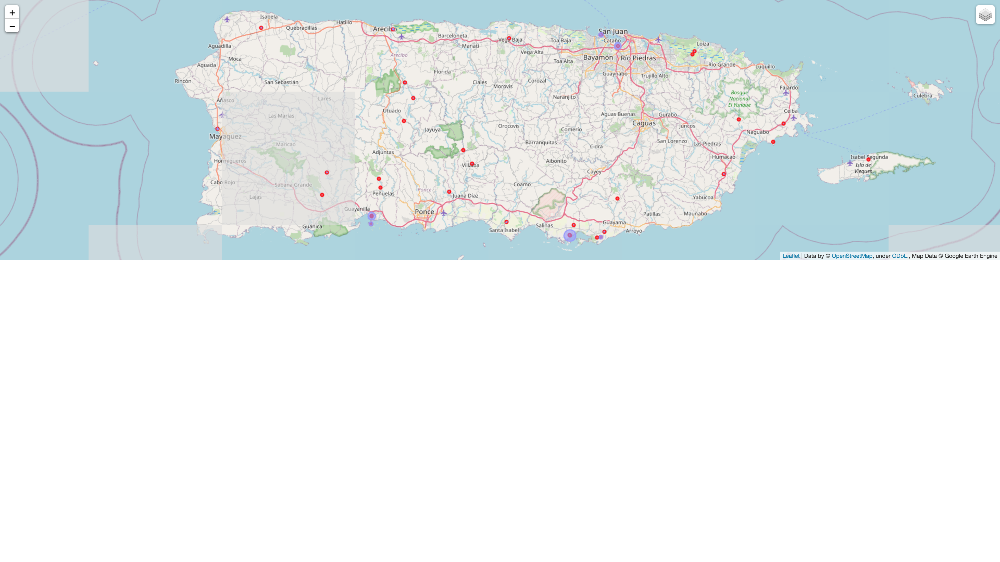

In [19]:
Image(os.path.join(IMAGES_PATH, "Power-Plants-Buffer-Zones-Mask.png"))

## 4.3 Distance Weights

In the third step of the approach I used GEE distance fuction to calculte the distance between pixels around power plant and the center of that power plant. Then I use that distance to compute pixel distance weight in a way that pixels away from power plant center will get less weight and pixels near the centroid will get higher weight.

Weights assigned only to pixels within a circle of maximum 5000m radius around power plant. The maximum weight will be 1 (most closed pixels) and the minimum will be 0 (for pixels that located at the edge of the defined circle).

In [18]:
def cal_dist_weights(pp_fc, max_dist=5000, max_error=100):
    """ Computes distance weights of distance betwwen pixels around
    power plant and its center.
    """
    distance = pp_fc.distance(searchRadius=max_dist, maxError=max_error)
    pp_dist_weights = distance.subtract(max_dist).abs().divide(max_dist)
    return pp_dist_weights

In [19]:
# Puerto Rico power plants distance weights
pp_pr_dist_weights = cal_dist_weights(pp_pr_fc)

In [5]:
# # Plot the computed distance weights
# dist_min_max = pp_pr_dist_weights.reduceRegion(ee.Reducer.minMax(),
#                                                geometry= pr_geometry,scale=1113).getInfo()
# min_val = dist_min_max['distance_min']
# max_val = dist_min_max['distance_max']
# vis_params = {
#     'min': min_val,
#     'max': max_val,
#     'palette': ['white', 'gray', 'black']
# }
# dist_weights_map = plot_ee_layer(pp_pr_dist_weights, 'Distance from power plant weight',
#                                  vis_params, pr_loc[0], pr_loc[1], 9)

# dist_weights_map.save(os.path.join(FIGURES_PATH,'Distance-Weights.html'))

print(' \n\t\t\t\t  \033[1;34m Distance from Power Plant Weights')
# dist_weights_map
IFrame(src=os.path.join(FIGURES_PATH,'Distance-Weights.html'), width = 950, height = 530)

 
				   Distance from Power Plant Weights


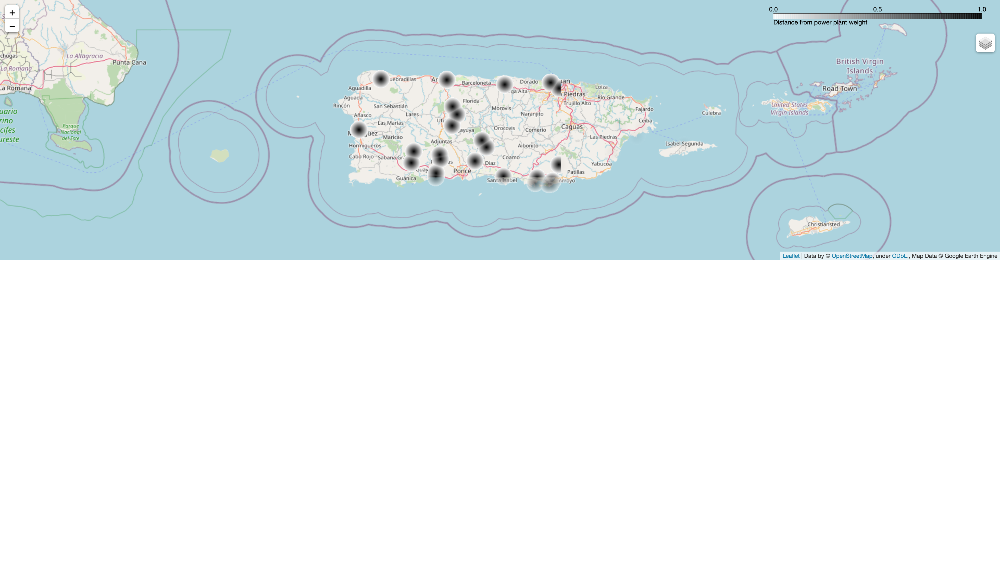

In [24]:
Image(os.path.join(IMAGES_PATH, "Distance-Weights.png"))

As it's shown in the map above, pixels near to power plants centers have higher weights (more darker) compared to others.

## 4.4 Composite NO2 Image of AOIs

This is the fourth step of the methodology, its purpose is to turn a NO2 image collection over a time period into one image contains values summation. As well as, selecting just values of AOIs. The process to accomplish that is as follows:

- Convert NO2 image unit from mol/m^2 to ton.
- Transform daily scattered image tiles to daily mosaic.
- Convert the date range images to one composite image using earth enging Reducer.sum() function.
- Exlclude pixels that don't fall in areas of interest regions by applying power plants buffer zones mask.

### Unit conversion

Sentinel-5P data come in mol/m^2 unit, this unit should be converted to another one more common like ton or pound (lb). The following two points explain how to change unit from mol/m^2 to ton for Sentinel-5P NO2 images:

- NO2 image single-pixel size (area) is 7x3.5 km^2 (24,500,000 m^2). Sentinel-5P data give value for each pixel (e.g. a pixel value is 0.89 mol/m^2). If multiplying that value by pixel area the resulting value will be in mol unit.
- Next, I'm going to convert mol to gram using NO2 molar mass (46.006 g/mol). Then convert gram to ton using the appropriate conversion factor.

When applying this process to each pixel of NO2 images the output NO2 emission will be in ton.

In [21]:
def convert_to_ton(no2_imgc):
    """ Converts pixel value unit from mol/m^2 to ton. """
    # convert mol/m^2 to mol
    pixel_area = ee.Number(24500000) # in m^2
    no2_imgc = no2_imgc.map(lambda image: image.multiply(pixel_area))
    
    # convert NO2 mol to NO2 gram
    no2_molar_mass = ee.Number(46.006) # in g/mol
    no2_imgc = no2_imgc.map(lambda image: image.multiply(no2_molar_mass))
    
    # convert gram to ton
    gram_to_ton_factor = ee.Number(1.10231e-6)
    no2_imgc = no2_imgc.map(lambda image: image.multiply(gram_to_ton_factor))
    
    return no2_imgc

### Daily mosaic image

- Sentinel-5p images come with different tiles, sometimes a single location has multiple tiles. I will use earth engine mosaic function to turn all tiles into a single image for each day. 

In [22]:
def _add_day_mosaic(date, newlist):
    """
    Convert daily tiles of image to daily mosaic image.
    """
    date = ee.Date(date)
    newlist = ee.List(newlist)
    filtered_imgc = no2_imgc.filterDate(date, date.advance(1,'day'))
    mosaic_img = ee.Image(filtered_imgc.mosaic())
    return ee.List(ee.Algorithms.If(filtered_imgc.size(), newlist.add(mosaic_img), newlist))

In [23]:
def cal_no2_sum(no2_imgc, start_date, end_date, geo_area, aoi_mask=None):
    """
    Builds composite NO2 image where each pixel is the sum of the input 
    image collection values over a time period and pick out exclusively
    pixels of aoi_maks.
    """
    num_days = end_date.difference(start_date, 'day')
    date_range = ee.List.sequence(0, num_days.subtract(1)).map(lambda i: start_date.advance(i,'day'))
    
    # Generating daily NO2 images
    no2_drange_imgc = ee.ImageCollection(ee.List(date_range.iterate(_add_day_mosaic, ee.List([]))))
    
    # Convert NO2 from mol/m^2 to ton
    no2_drange_imgc = convert_to_ton(no2_drange_imgc)
    
    # Select only the given geographic area
    no2_drange_imgc = no2_drange_imgc.map(lambda image: image.clip(geo_area))
    
    # Convert the date range images to one composite image using ee.Reducer.sum()
    sum_no2_img = no2_drange_imgc.reduce(ee.Reducer.sum())
    
    # exlclude pixels that don't fall in area of interest region
    if aoi_mask:
        aoi_sum_no2_img = sum_no2_img.updateMask(aoi_mask)
        return aoi_sum_no2_img
    else:
        return sum_no2_img

Now, Let us execute the process of step four to get yearly NO2 emission sum image of 2019 for Puerto Rico. I won't use the power plants mask to see how the emission is spread over the whole Puerto Rico territory.

In [6]:
# # Compute yearly NO2 emission sum image of 2019 for Puerto Rico.
# year = 2019
# start_date = ee.Date(str(year)+'-01-01')
# end_date = ee.Date(str(year+1)+'-01-01')  # excluded
# yearly_no2_sum_img = cal_no2_sum(no2_pr_imgc, start_date, end_date, pr_geometry, None)

# # Visualize the computed yearly total NO2 emission
# no2_min_max = yearly_no2_sum_img.reduceRegion(ee.Reducer.minMax(),
#                                           geometry=pr_geometry, scale=1113).getInfo() 
# vis_params = {
#     'min': 0.0,
#     'max': no2_min_max['tropospheric_NO2_column_number_density_sum_max'],
#     'palette': ['blue', 'white', 'red'] 
# }
# yearly_no2_map = plot_ee_layer(yearly_no2_sum_img, 'Yearly NO2 Emission 2019 (Ton)',
#                                vis_params, pr_loc[0], pr_loc[1], 9)

# yearly_no2_map.save(os.path.join(FIGURES_PATH,'Yearly-NO2-Sum-PR-2019.html'))

print(' \n\t\t\t\t  \033[1;34m Yearly NO2 Emission 2019 of Puerto Rico (Ton)')
# yearly_no2_map
IFrame(src=os.path.join(FIGURES_PATH,'Yearly-NO2-Sum-PR-2019.html'), width = 950, height = 530)

 
				   Yearly NO2 Emission 2019 of Puerto Rico (Ton)


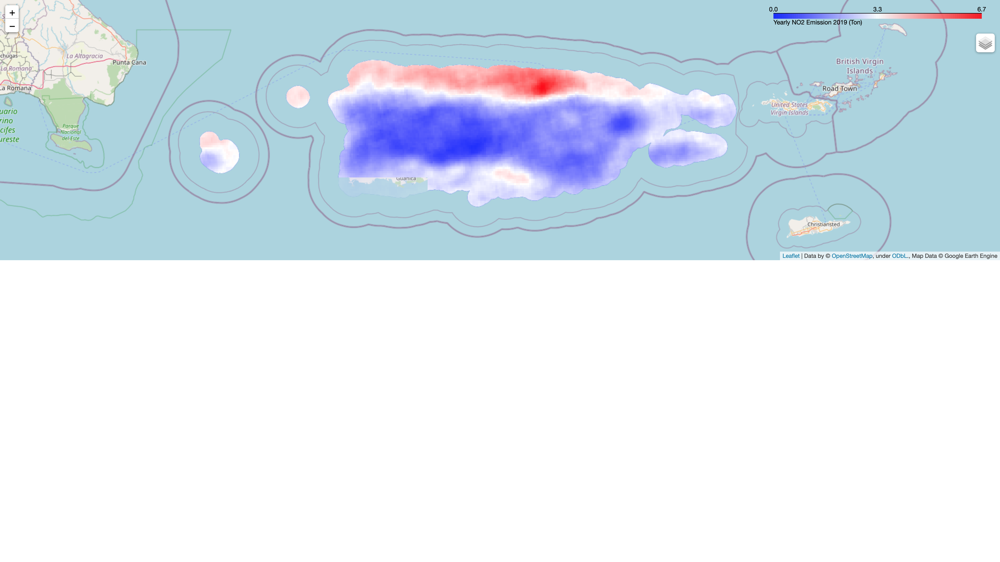

In [30]:
Image(os.path.join(IMAGES_PATH, "Yearly-NO2-Sum-PR-2019.png"))

- From the picture above it is noticeable that the yearly amount of NO2 is mostly concentrated in the north of Puerto Rico. Some other vivid NO2 locations are in the south and the two western islands.

For this analysis I'm interested in NO2 emission from electricity generation, So in step four I use  power plants buffer zones (AOIs) mask. The following is yearly NO2 emission amount from electricity generation of 2019 for Puerto Rico.

 
				   Yearly Power Plants NO2 Emission 2019 (Ton)


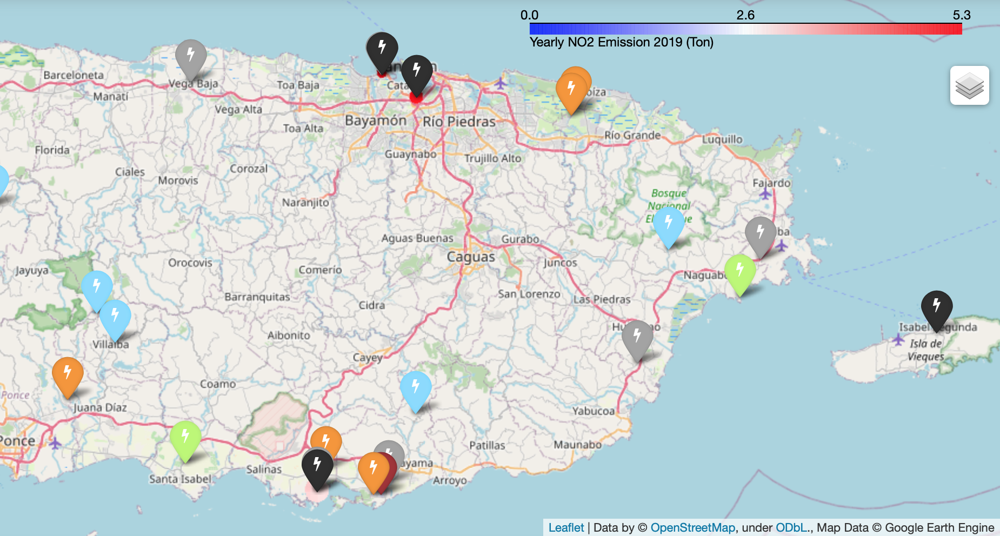

In [33]:
# # Compute yearly NO2 emission from electricity generation of 2019 for Puerto Rico.
# year = 2019
# start_date = ee.Date(str(year)+'-01-01')
# end_date = ee.Date(str(year+1)+'-01-01')  # excluded
# yearly_no2_sum_img = cal_no2_sum(no2_pr_imgc, start_date, end_date, pr_geometry, pp_pr_mask)

# # Visualization
# no2_min_max = yearly_no2_sum_img.reduceRegion(ee.Reducer.minMax(),
#                                           geometry=pr_geometry, scale=1113).getInfo() 
# vis_params = {
#     'min': 0.0,
#     'max': no2_min_max['tropospheric_NO2_column_number_density_sum_max'],
#     'palette': ['blue', 'white', 'red'] 
# }
# yearly_no2_map = plot_ee_layer(yearly_no2_sum_img, 'Yearly NO2 Emission 2019 (Ton)',
#                                vis_params, pr_loc[0], pr_loc[1], 10)

print(' \n\t\t\t\t  \033[1;34m Yearly Power Plants NO2 Emission 2019 (Ton)')
# yearly_no2_map = add_pp_to_map(pp_pr_df, yearly_no2_map)
# yearly_no2_map
Image(os.path.join(IMAGES_PATH, "Yearly Power Plants NO2 Emission 2019.png"))

## 4.5 Total NO2 Emission

At the last step of the method (the 5th) I'm going to apply GEE reduceRegion function to the built composite NO2 image, this function is used with sum reducer and the computed distance weights. The output is single total NO2 value.

In [34]:
def cal_total_no2(sum_no2_img, weights, geo_area):
    """
    Calculates total NO2 from an image with and without weights.
    """
    # Add weights as a band to no2 composite image
    sum_no2_img = sum_no2_img.addBands(weights)
    
    # Compute total NO2
    total_no2 = sum_no2_img.reduceRegion(reducer = ee.Reducer.sum(),
                                         geometry = geo_area, scale = 1113)
    total_no2 = total_no2.get('tropospheric_NO2_column_number_density_sum').getInfo()
    
    # Compute total weighted NO2
    total_weighted_no2 = sum_no2_img.reduceRegion(reducer = ee.Reducer.sum().splitWeights(),
                                                  geometry = geo_area, scale = 1113)
    total_weighted_no2 = total_weighted_no2.get('sum').getInfo()
    
    return total_no2, total_weighted_no2

Let's compute the yearly total NO2 emission from electricity generation of 2019 for Puerto Rico.

In [30]:
yearly_total_no2, yearly_total_weighted_no2 = cal_total_no2(yearly_no2_sum_img,
                                                            pp_pr_dist_weights, pr_geometry)

print("- NO2 emission from electricity generation of 2019 for Puerto Rico:")
print(f"    Total NO2: {yearly_total_no2:.3f} Ton") 
print(f"    Total weighted NO2: {yearly_total_weighted_no2:.3f} Ton") 

gc.collect()

- NO2 emission from electricity generation of 2019 for Puerto Rico:
    Total NO2: 40.231 Ton
    Total weighted NO2: 31.811 Ton


272

# 5 Individual Power Plant NO2 Emission

In this section, I will compute NO2 emission from power plants individually across USA for 2019 using the same methodology. Then evaluating the result with 2019 EPA power plant bottom-up emission data.

## 5.1 Total NO2 Emission in 2019

In [31]:
def compute_pp_total_no2(pp_f, start_date, end_date):
    """ This function implements the developed computing methodoly,
    and returns the total NO2 emission from the input power plant feature
    for the period betwwen the given start_date and end_date.
    """
    num_days = end_date.difference(start_date, 'day')
    date_range = ee.List.sequence(0, num_days.subtract(1)).map(lambda i: start_date.advance(i,'day'))


    ## AOI
    radius = ee.Number(pp_f.get('capacitymw')).multiply(1.1)
    pp_buffer_f = ee.Feature(pp_f.buffer(radius))
    aoi_geometry = pp_buffer_f.geometry()


    ## Buffer zone mask
    aoi_mask = ee.Image().toByte().paint(pp_buffer_f, 1)
    
    
    ## Distance weights
    max_dist = ee.Number(5000)
    distance = ee.FeatureCollection([pp_f]).distance(searchRadius=max_dist, maxError=100)
    dist_weights = distance.subtract(max_dist).abs().divide(max_dist)
    
    
    ## Composite NO2 image of AOI
    no2_aoi_imgc = ee.ImageCollection('COPERNICUS/S5P/OFFL/L3_NO2')\
    .select('tropospheric_NO2_column_number_density')\
    .filterBounds(aoi_geometry)

    def add_day_mosaic(date, newlist):
        date = ee.Date(date)
        newlist = ee.List(newlist)
        filtered_imgc = no2_aoi_imgc.filterDate(date, date.advance(1,'day'))
        mosaic_img = ee.Image(filtered_imgc.mosaic())
        return ee.List(ee.Algorithms.If(filtered_imgc.size(), newlist.add(mosaic_img), newlist))
    
    # Generating daily NO2 mosaic images
    no2_drange_imgc = ee.ImageCollection(ee.List(date_range.iterate(add_day_mosaic, ee.List([]))))
    
    # Convert NO2 from mol/m^2 to ton    
    no2_drange_imgc = no2_drange_imgc.map(lambda image: image.multiply(24500000))
    no2_drange_imgc = no2_drange_imgc.map(lambda image: image.multiply(46.006))
    no2_drange_imgc = no2_drange_imgc.map(lambda image: image.multiply(1.10231e-6))

    # Select only the given geographic area
    no2_drange_imgc = no2_drange_imgc.map(lambda image: image.clip(aoi_geometry))
    
    # Convert the date range images to one composite image using ee.Reducer.sum()
    sum_no2_img = no2_drange_imgc.reduce(ee.Reducer.sum())
    
    # exlclude pixels that don't fall in area of interest region
    aoi_sum_no2_img = sum_no2_img.updateMask(aoi_mask)

    
    ## Total NO2 emission
    
    # Add weights as a band to no2 composite image
    aoi_sum_no2_img = aoi_sum_no2_img.addBands(dist_weights)
    
    # Compute total NO2
    total_no2 = aoi_sum_no2_img.reduceRegion(reducer = ee.Reducer.sum(),
        geometry=aoi_geometry, scale = 1113)
    total_no2 = total_no2.get('tropospheric_NO2_column_number_density_sum')
    
    # Compute total weighted NO2
    total_weighted_no2 = aoi_sum_no2_img.reduceRegion(reducer = ee.Reducer.sum().splitWeights(),
        geometry = aoi_geometry, scale = 1113)
    total_weighted_no2 = total_weighted_no2.get('sum')
    
    
    pp_f = pp_f.set({'total_no2' : total_no2})
    pp_f = pp_f.set({'total_weighted_no2' : total_weighted_no2})
    
    return pp_f

First, let's select only power plants that exist in the evaluation data. 

In [32]:
# Pick out target power plants
name_filter = ee.Filter.inList('name', epa_pp_no2_df['Facility Name'].tolist())
lat_filter = ee.Filter.inList('latitude', epa_pp_no2_df['Latitude (degrees)'].tolist())
lon_filter = ee.Filter.inList('longitude', epa_pp_no2_df['Longitude (degrees)'].tolist())

filtered_pp_fc = pp_fc.filter(ee.Filter.Or(name_filter, ee.Filter.And([lat_filter, lon_filter])))

In [33]:
# Number of target power plants
n_pp = filtered_pp_fc.size().getInfo()
print(n_pp)

876


To avoid computation limit, I'll batch computation in different parts.

In [34]:
start_date = ee.Date('2019-01-01')
end_date = ee.Date('2020-01-01')

num_per_batch = 150
n_iter = math.ceil(n_pp/num_per_batch)
indx = 0

In [35]:
# Get power plants codes list
pp_codes = filtered_pp_fc.reduceColumns(reducer=ee.Reducer.toList(),
                                        selectors=['gppd_idnr']).getInfo().get('list')

**Warning**: the next cell may take close to 30 minutes to run, or more depending on your hardware.

In [31]:
%%time

# Compute total NO2 of each power plant
totalno2_pp_df_list = []

for i in range(1, n_iter+1):
    # Current power plants batch
    if i < n_iter:
        cur_pp_fc = filtered_pp_fc.filter(ee.Filter.inList('gppd_idnr', pp_codes[indx:indx+num_per_batch]))
        indx += num_per_batch
    else:
        cur_pp_fc = filtered_pp_fc.filter(ee.Filter.inList('gppd_idnr', pp_codes[indx:]))
    
    totalno2_cur_pp_fc = cur_pp_fc.map(lambda pp: compute_pp_total_no2(pp, start_date, end_date))
    
    # keep only the needed columns
    cols = ['gppd_idnr', 'name', 'latitude', 'longitude', 'total_no2', 'total_weighted_no2']
    
    totalno2_cur_pp_fc =  totalno2_cur_pp_fc.reduceColumns(
        reducer = ee.Reducer.toList().repeat(6),
        selectors = cols).getInfo()
    
    # Create dataframe from total no2 feature collection
    totalno2_cur_pp_df = pd.DataFrame()
    for i in range(len(cols)):
        totalno2_cur_pp_df[cols[i]] = totalno2_cur_pp_fc.get('list')[i]
    
    totalno2_pp_df_list.append(totalno2_cur_pp_df)

totalno2_pp_df = pd.concat(totalno2_pp_df_list)

CPU times: user 660 ms, sys: 28.8 ms, total: 688 ms
Wall time: 18min 7s


In [32]:
# View the result dataframe
totalno2_pp_df.head()

,gppd_idnr,name,latitude,longitude,total_no2,total_weighted_no2
0,USA0001233,Fort Dodge,37.7328,-99.9497,0.000000,0.000000
1,USA0003008,Mooreland,36.4372,-99.2254,0.618709,1.652559
2,USA0003006,Anadarko Plant,35.0847,-98.2300,1.769367,3.386507
3,USA0000762,Ponca,36.7198,-97.0858,0.000000,0.000000
4,USA0055651,Spring Creek Energy Center,35.7422,-97.6550,0.000000,0.000000


In [34]:
# Save the computed total NO2 data
totalno2_pp_df.to_csv(os.path.join(DATA_PATH, "output/totalno2_pp.csv"), index=False)

## 5.1 Evaluation 

In [35]:
totalno2_pp_df = pd.read_csv(os.path.join(DATA_PATH, "output/totalno2_pp.csv"))

# Merge evaluation dataframe with the computed dataframe
no2_emission_df = totalno2_pp_df.merge(epa_pp_no2_df, left_on=['latitude', 'longitude'],
                               right_on=['Latitude (degrees)', 'Longitude (degrees)'], how='inner')
pp_no2_emission_df = no2_emission_df[abs(no2_emission_df['total_no2'] - no2_emission_df['2019 NOX Emissions (tons)']) < 7]
pp_no2_emission_df = pp_no2_emission_df.sort_values(['total_no2'], ascending=False).reset_index(drop=True)
pp_no2_emission_df = pp_no2_emission_df[pp_no2_emission_df['total_no2'] > 0]
pp_no2_emission_df.head(5)

,gppd_idnr,name,latitude,longitude,total_no2,total_weighted_no2,Facility Name,State,1995 NOX Emissions (tons),2019 NOX Emissions (tons),1995 vs 2019 NOX Emissions (tons),Latitude (degrees),Longitude (degrees)
0,USA0003804,Possum Point,38.5367,-77.2806,140.041728,108.398477,Possum Point Power Station,VA,"16,017",144.0,"-15,873",38.5367,-77.2806
1,USA0003406,Johnsonville,36.0278,-87.9861,60.802317,46.326319,Johnsonville,TN,"19,695",61.0,"-19,634",36.0278,-87.9861
2,USA0055151,La Paloma Generating LLC,35.2956,-119.5919,37.678784,33.617667,La Paloma Generating Plant,CA,NaN,33.0,NaN,35.2956,-119.5919
3,USA0001599,Canal,41.7694,-70.5097,30.625142,29.610093,Canal Station,MA,"4,055",27.0,"-4,028",41.7694,-70.5097
4,USA0008012,Croydon CT Generating Station,40.0800,-74.8917,10.070685,10.382795,Croydon Generating Station,PA,NaN,11.0,NaN,40.0800,-74.8917


In [25]:
# # Visualize the bottom-up and the computed NO2 values of 
# # some power plants
# fig = go.Figure()

# fig.add_trace(go.Scatter(
#     name = "Satellite data",
#     x = pp_no2_emission_df['total_no2'],
#     y = pp_no2_emission_df['name'],
#     mode = 'markers',
#     marker_color = 'orange',
#     hovertemplate="Name: %{y} <br>NO2: %{x:.2f} Ton <extra></extra>",
#     hoverlabel=dict(
#         bgcolor="rgba(255,165,0,0.5)",
#         bordercolor="#7D7D7D",
#         font=dict(family="Arial", size=12, color="#4A4A4A"),
#     ),
# ))

# fig.add_trace(go.Scatter(
#     name = "Bottom-up data",
#     x = pp_no2_emission_df['2019 NOX Emissions (tons)'],
#     y = pp_no2_emission_df['name'],
#     mode = 'markers',
#     marker_color = 'teal',
#     hovertemplate="Name: %{y} <br>NO2: %{x:.2f} Ton <extra></extra>",
#     hoverlabel=dict(
#         bgcolor="rgba(0, 128, 128, 0.4)",
#         bordercolor="#7D7D7D",
#         font=dict(family="Arial", size=12, color="#4A4A4A"),
#     ),
# ))

# fig.update_layout(
#     title = dict(
#         text = "Power Plants Total NO2 Emission (Ton) in 2019",
#         font_color = 'purple'
#     ),
#     plot_bgcolor="whitesmoke",
#     xaxis = dict(
#         title = "2019 NO2 Emission (Ton)",
#     )
# )

# fig.write_html(os.path.join(FIGURES_PATH,"Power Plants Total NO2 in 2019.html"))
# fig.show()

IFrame(src=os.path.join(FIGURES_PATH,"Power Plants Total NO2 in 2019.html"),
       width = 950, height = 530)

The figure above shows that the computed value of NO2 emission using remote sensing is to some extent correlated with the bottom-up emission, which means that the developed model can perform well in some cases.

In [37]:
# Difference between bottom-up and computed NO2 emission
diff = abs(pp_no2_emission_df['2019 NOX Emissions (tons)'] - pp_no2_emission_df['total_no2'])
print(diff)

0     3.958272
1     0.197683
2     4.678784
3     3.625142
4     0.929315
5     6.367538
6     0.721973
7     3.254392
8     5.293620
9     4.474555
10    2.924990
11    2.139761
12    3.485418
dtype: float64


In [38]:
# The average difference between bottom-up emission and computed emission
print(f"Average difference is %.2f Ton in 2019" %np.mean(diff))

Average difference is 3.23 Ton in 2019


# 6 Conclusion

At the end I want concluding with some advantages of the approach and a few improvement possibilities:

- The method and its implementation are fully based on google earth engine platform, which makes it very fast and easily scalable.

- It's smoothly applicable to any geospatial area using the area geometry feature.

- It works for any time period, simply define the start date and the end date.

- There are a lot of factors that affect NO2 in atmosphere like population, traffic, factories, etc., Hence to get  NO2 emission only from power plants noise from other sources should be removed.

- Weather has many various effects on NO2 in atmosphere, for example heavy wind tends to move NO2 from its sources very quickly and as a result influences spatial patterns.

Thanks for reading!